In [1]:
#Import necessary modules
import numpy as np
from matplotlib import pyplot as plt
from sklearn import datasets
import matplotlib.pyplot as plt
from sklearn import mixture
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
import math
import statistics as stat
import csv
import pandas as pd
import sklearn
import shap
from sklearn import linear_model
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import lime
from scipy.stats import multivariate_normal
from scipy.integrate import quad

In [2]:
#loading data-set
iris_X, iris_y = datasets.load_iris(return_X_y=True)

features=datasets.load_iris().feature_names


species=datasets.load_iris().target_names

features0=['sepal.length', 'sepal.width', 'petal.length', 'petal.width.']
features=['s.l','s.w','p.l','p.w']


#scaling input.
iris_X_scale=sklearn.preprocessing.scale(iris_X)

#train test split
X_train, X_test, y_train, y_test = train_test_split(iris_X_scale, iris_y, test_size=0.2, random_state=0)
model = linear_model.LinearRegression()
model.fit(X_train, y_train)

print('accuracy score on test and train set: ')
print(accuracy_score(y_test, np.round(model.predict(X_test))))
print(accuracy_score(y_train, np.round(model.predict(X_train))))






#Printing to file so the same configuration can be used in R.
train=np.c_[X_train, y_train]
train=pd.DataFrame((train))
train.to_csv('Iris_train.csv')

test=np.c_[X_test, y_test]
test=pd.DataFrame(test)
test.to_csv('Iris_test.csv')



print('model coefficients:')
print(model.intercept_)
print(model.coef_)
print('model coefficients inpact on prediction on test sample 0,1 and 2:')
print(model.coef_*X_test[0])
print(model.coef_*X_test[1])
print(model.coef_*X_test[2])

accuracy score on test and train set: 
1.0
0.9583333333333334
model coefficients:
1.0124894837338205
[-0.08770916 -0.01725498  0.40280209  0.46434748]
model coefficients inpact on prediction on test sample 0,1 and 2:
[0.00460526 0.01022138 0.30724063 0.73388437]
[-0.0166498   0.03405362  0.05540405 -0.12183866]
[ 0.03648786 -0.04538718 -0.53984605 -0.61082325]


In [376]:

#calclatin regression model through least squares.
intercept = np.ones((len(X_train),1))

X_reg= np.append(intercept, X_train, axis=1)
X_reg[:,4]=sklearn.preprocessing.scale(X_reg[:,4])
X_reg[:,1]=sklearn.preprocessing.scale(X_reg[:,1])
X_reg[:,2]=sklearn.preprocessing.scale(X_reg[:,2])
X_reg[:,3]=sklearn.preprocessing.scale(X_reg[:,3])
print(y_train.dot(y_train))
yty=y_train.T.dot(y_train)
y=(1/yty)*y_train
X_reg=(1/yty)*X_reg
print(stat.variance(X_reg[:,0]))
r=X_reg.T.dot(y)
C=(X_reg.T.dot(X_reg))

Cinv=np.linalg.inv(C)
beta=Cinv.dot(r)
print('coefficients')
print(beta)
#print(X_reg*beta)
print("sum of square error:")
e=y-X_reg.dot(beta)

ete=e.T.dot(e)
print('error')
print(ete)
SS=y-sum(y)/len(y)
SST=SS.T.dot(SS)
print('SST')
print(SST)
Rsquare=1-ete/SST
r=C.dot(beta)
print(r.dot)
print("R^2")
print(Rsquare)
XTy=X_reg.T.dot(y)
NEF=beta.dot(XTy)

#print(beta[2:].T.dot(beta[2:]))

#print(r.T.dot(Cinv.T.dot(r))/SST)



print(y.T.dot(y))
yty=y.T.dot(y)
print(yty)
print(ete)
print(1-2*beta.T.dot(r)+beta.T.dot(C.dot(beta)))
print(ete/yty)

print(1-ete/yty)

213
0.0
coefficients
[ 1.04166667 -0.09000309 -0.01708388  0.40693384  0.47194134]
sum of square error:
error
0.00012040042681961516
SST
0.001824851036317015
<built-in method dot of numpy.ndarray object at 0x1a22b4d670>
R^2
0.9340217779843488
0.004694835680751174
0.004694835680751174
0.00012040042681961516
0.9954255647460685
0.025645290912578028
0.9743547090874219


1.0084033613445378


In [377]:
x=iris_X_scale
x=iris_X_scale[:,0]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)
#model1=linear_model.LinearRegression().fit(x, y)
#print(x.dot(beta))
e=y-x.dot(beta)
ete=e.T.dot(e)
print(ete)
#print(1-ete/119)
#print(model1.coef_)
#print(beta)
print(beta.T.dot(C.dot(beta)))
x=iris_X_scale[:,1]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)

150.0
0.7825612318100814
58.13968777018319


AttributeError: 'numpy.float64' object has no attribute 'dot'

In [286]:
x=iris_X_scale
x=iris_X_scale[:,0]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)
#model1=linear_model.LinearRegression().fit(x, y)
#print(x.dot(beta))
e=y-x.dot(beta)
ete=e.T.dot(e)
print(ete)
#print(1-ete/119)
#print(model1.coef_)
#print(beta)
print(beta.T.dot(C.dot(beta)))
x=iris_X_scale[:,1]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)
#model1=linear_model.LinearRegression().fit(x, y)
#print(x.dot(beta))
e=y-x.dot(beta)
ete=e.T.dot(e)
print(ete)
#print(1-ete/119)
#print(model1.coef_)
#print(beta)
#print(beta.T.dot(C.dot(beta)))
x=iris_X_scale[:,2]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)
#model1=linear_model.LinearRegression().fit(x, y)
#print(x.dot(beta))
e=y-x.dot(beta)
ete=e.T.dot(e)
print(ete)
#print(1-ete/119)
#print(model1.coef_)
#print(beta)
#print(beta.T.dot(C.dot(beta)))
x=iris_X_scale[:,3]
y=sklearn.preprocessing.scale(iris_y)
r=x.T.dot(y)
C=(x.T.dot(x))
print(C)
Cinv=1/C
beta=Cinv*r
print(beta)
#model1=linear_model.LinearRegression().fit(x, y)
#print(x.dot(beta))
e=y-x.dot(beta)
ete=e.T.dot(e)
print(ete)
#print(1-ete/119)
#print(model1.coef_)
#print(beta)
#print(beta.T.dot(C.dot(beta)))


print(58+122+14+12)

150.0
0.7825612318100814
58.13968777018319


AttributeError: 'numpy.float64' object has no attribute 'dot'

In [9]:
shap.initjs()



# use Kernel SHAP to explain test set predictions 0,1 and 2
explainer = shap.KernelExplainer(model.predict, X_train, link="identity")
shap_values = explainer.shap_values(X_test, nsamples=100, rseed=0)

shap_values_train=explainer.shap_values(X_train, nsamples=100, rseed=0)
print('Print Intercept(phi_0):')
print(explainer.expected_value)
print('shap values for sample 0,1 and 2')
print('Phi1, phi2, phi3 and phi4:')
print(shap_values[0])
print(shap_values[1])
print(shap_values[2])


#saving plots
#for explenation of prediction using kernel SHAP
shap.force_plot(explainer.expected_value, shap_values[0], features,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_kernelSHAP0.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values[1], features, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_kernelSHAP1.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values[2], features, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_kernelSHAP2.png',dpi=300,pad_inches=0.1,matplotlib=True,bbox_inches='tight')




Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_


Print Intercept(phi_0):
1.0416666666666667
shap values for sample 0,1 and 2
Phi1, phi2, phi3 and phi4:
[0.00859059 0.0100625  0.29400013 0.71412124]
[-0.01266448  0.03389474  0.04216355 -0.14160179]
[ 0.04047319 -0.04554606 -0.55308655 -0.63058638]


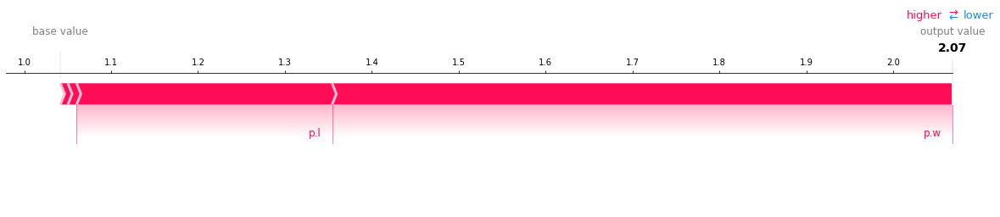

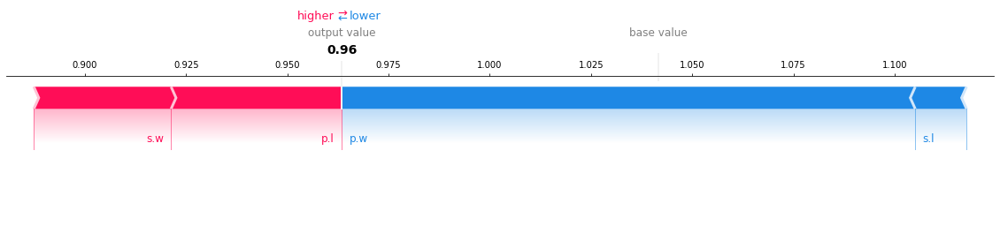

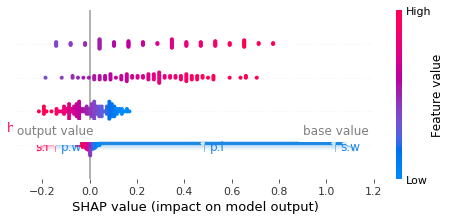

In [10]:
#summary plot kernel SHAP on training set. 
shap.summary_plot(shap_values_train,X_train,features0,show=True)
plt.savefig('foo.png',dpi=300,pad_inches=0.1,bbox_inches='tight')


In [11]:


#Using LIME to explain the same samples
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features, class_names=datasets.load_iris().target_names, random_state=0,verbose=True, mode='regression')


#LIME values with intercept, prediction and right prediction
exp0 = explainer.explain_instance(X_test[0], model.predict, num_features=4)#decided 4 features
lime0=np.array([exp0.as_list()[i][1] for i in range(len(exp0.as_list())) ])
lime0_feature=np.array([exp0.as_list()[i][0] for i in range(len(exp0.as_list())) ])
lime0_feature[2]=lime0_feature[2][0:10]+"\n"+lime0_feature[2][10:]
print('LIME intercept sample 0')
print(exp0.intercept[0])
print('LIME coefficients sample 0')
print(lime0)

#LIME values with intercept, prediction and right prediction
exp1 = explainer.explain_instance(X_test[1], model.predict, num_features=4)
lime1= np.array([exp1.as_list()[i][1] for i in range(len(exp1.as_list())) ])
lime1_feature=np.array([exp1.as_list()[i][0] for i in range(len(exp1.as_list())) ])
print('LIME intercept sample 1')
print(exp1.intercept[0])
print('LIME coefficients sample 1')
print(lime1)


#LIME values with intercept, prediction and right prediction
exp2 = explainer.explain_instance(X_test[2], model.predict, num_features=4)
lime2=np.array([exp2.as_list()[i][1] for i in range(len(exp2.as_list())) ])
lime2_feature=np.array([exp2.as_list()[i][0] for i in range(len(exp2.as_list())) ])
print('LIME intercept sample 2')
print(exp2.intercept[0])
print('LIME coefficients sample 2')
print(lime2)

#saving figures
shap.force_plot(exp0.intercept[0], lime0, lime0_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_LIME0.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(exp1.intercept[0], lime1, lime1_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_LIME1.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(exp2.intercept[0], lime2, lime2_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.1, 2.2)
plt.savefig('iris_LIME2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')





Intercept 0.7327734468789711
Prediction_local [1.89734081]
Right: 2.0684411272123358
LIME intercept sample 0
0.7327734468789711
LIME coefficients sample 0
[0.78594457 0.32554141 0.03085902 0.02222236]
Intercept 1.099048907942296
Prediction_local [0.70118973]
Right: 0.9634586929722336
LIME intercept sample 1
1.099048907942296
LIME coefficients sample 1
[-0.21131762 -0.13068515 -0.07903669  0.02318028]
Intercept 1.4642452348209258
Prediction_local [-0.12317703]
Right: -0.1470791278796446
LIME intercept sample 2
1.4642452348209258
LIME coefficients sample 2
[-0.84707293 -0.7630927   0.06387129 -0.04112792]



1.0416666666666667
[-0.014974    0.00791001  0.17559681  0.85824194]
[ 0.01066531  0.0342878   0.01220557 -0.13536674]
[ 0.01888626 -0.04216051 -0.53467893 -0.63079263]


<Figure size 432x288 with 0 Axes>

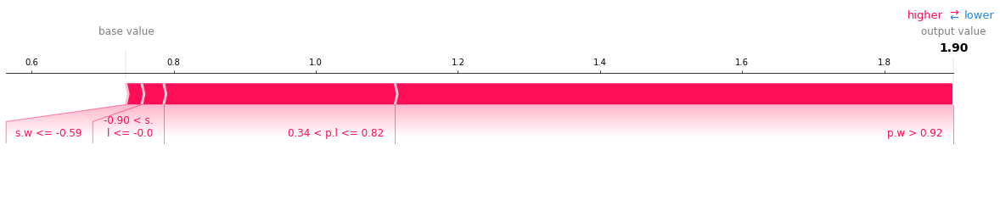

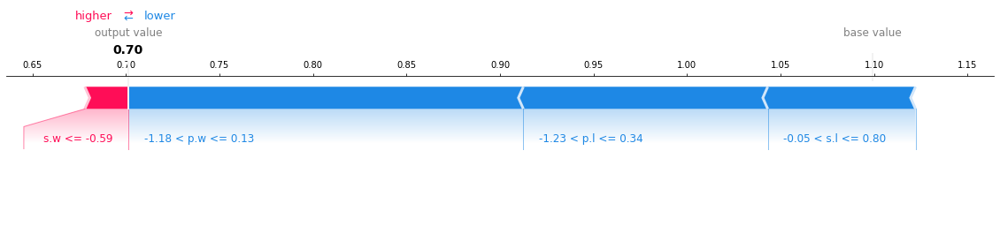

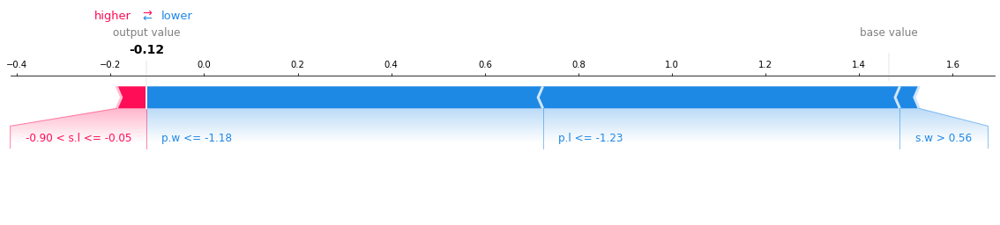

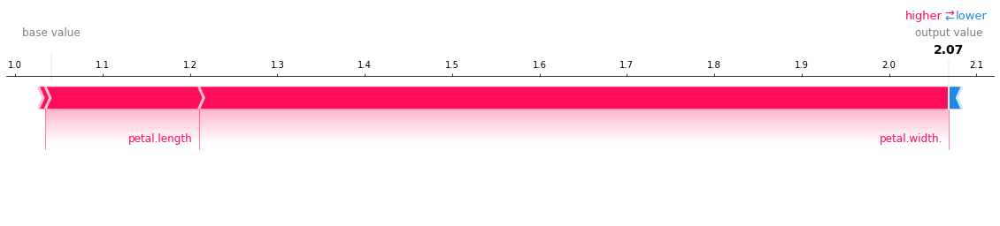

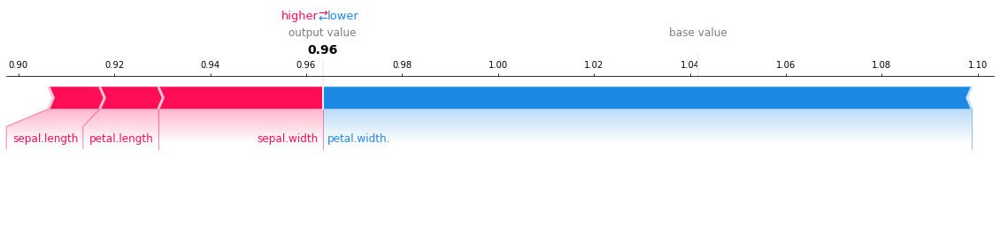

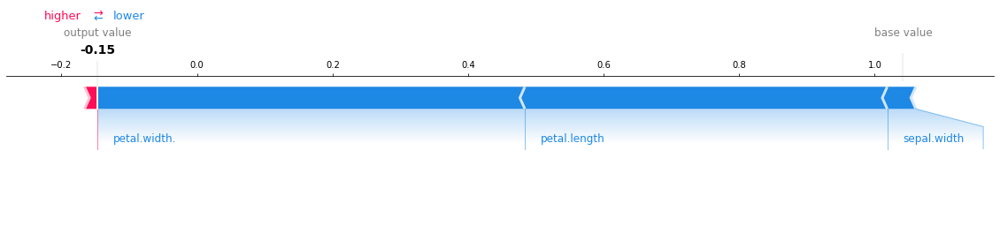

In [12]:
np.random.seed(0)


# use Shapley sampling values to explain test set predictions
explainer = shap.SamplingExplainer(model.predict, X_train, link="identity")
shap_values = explainer.shap_values(X_test, nsamples=100,rseed=0)
print(explainer.expected_value)
print(shap_values[0])
print(shap_values[1])
print(shap_values[2])

shap.force_plot(explainer.expected_value, shap_values[0], features0,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_linSSV0.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values[1], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_linSSV1.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values[2], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_linSSV2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
plt.show()



In [157]:
print(lime0_feature[2][0:14]+"\n"+lime0_feature[2][14:]) 

-0.90 < s.
l <
= -0.0


Run section until the number below is: 0.9833333333333333
0.9833333333333333
1.0
[2 1 0 2 0 2 0 1 1 1 2 1 1 1 1 0 1 1 0 0 2 1 0 0 2 0 0 1 1 0]
[2 1 0 2 0 2 0 1 1 1 2 1 1 1 1 0 1 1 0 0 2 1 0 0 2 0 0 1 1 0]
[[-0.99699409  0.79471007 -1.30524965 -1.26144135]
 [ 0.04689704 -0.69870194  0.23573366  0.13402822]
 [ 0.9192279  -0.17155425  1.00516154  1.06899372]]
[0. 0. 0. ... 2. 2. 2.]


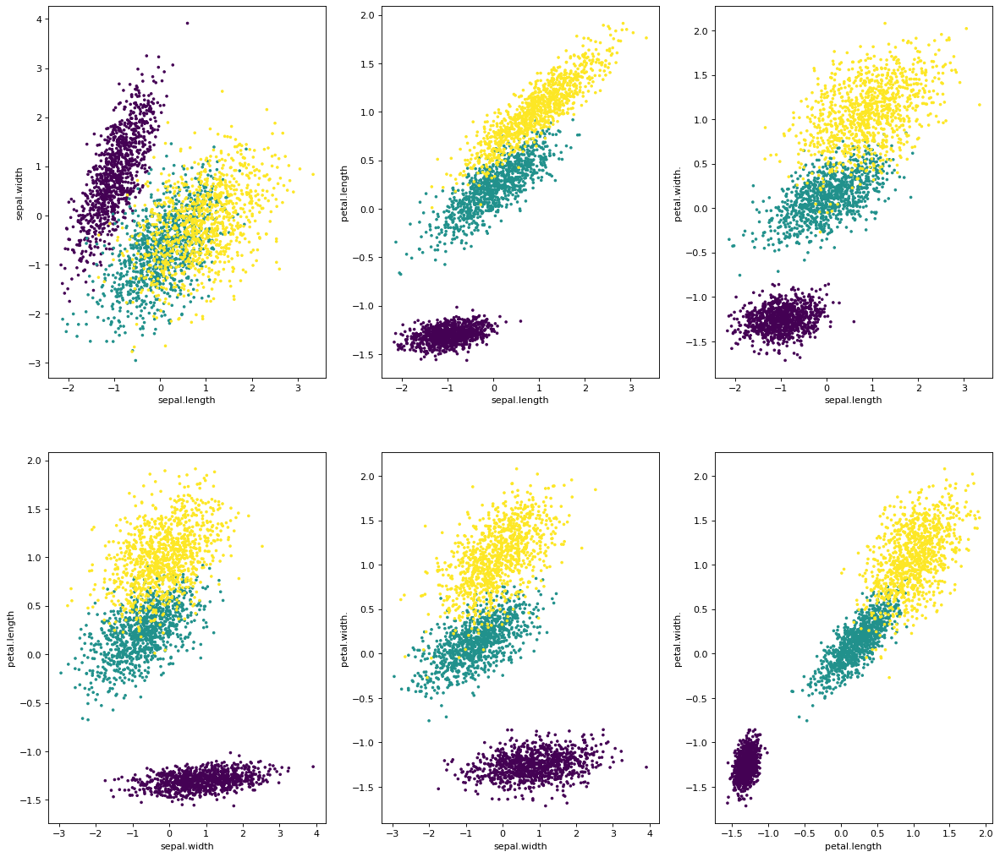

In [13]:
#initialize EM algorithm with these means 
means_init=np.array([[-0.99699409 , 0.79471007, -1.30524965 ,-1.26144135]
 ,[ 0.04627877 ,-0.69878579  ,0.23490093  ,0.13326567]
 ,[ 0.91830207 ,-0.17232824,  1.00455769,1.06807536]])
np.random.seed(0)
gmm = mixture.GaussianMixture(n_components=3,means_init=means_init).fit(X_train,y_train)


print('Run section until the number below is: 0.9833333333333333')
print(accuracy_score(y_train,gmm.predict(X_train)))
print(accuracy_score(y_test,gmm.predict(X_test)))
print(gmm.predict(X_test))
print(y_test)
print(gmm.means_)


#simulation of gaussian distribution not used in thesis.
np.random.seed(0)
X_0=np.random.multivariate_normal(gmm.means_[0,:],gmm.covariances_[0],1000)
X_1=np.random.multivariate_normal(gmm.means_[1,:],gmm.covariances_[1],1000)
X_2=np.random.multivariate_normal(gmm.means_[2,:],gmm.covariances_[2],1000)
y_0=np.zeros(1000)
y_1=np.ones(1000)
y_2=np.ones(1000)*2


y_sim=np.concatenate((y_0,y_1,y_2))
print(y_sim)
X_sim=np.concatenate((X_0, X_1, X_2))

groups=("setosa", "versicolor", "virginica")
groups=np.concatenate(([groups[0]]*1000, [groups[1]]*1000, [groups[2]]*1000))
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')

ax0=plt.subplot(231)
plt.scatter(X_sim[:,0], X_sim[:,1],c=y_sim,s=5)
ax0.set_xlabel(features0[0])
ax0.set_ylabel(features0[1])
ax1=plt.subplot(232)
plt.scatter(X_sim[:,0], X_sim[:,2],c=y_sim,s=5)
ax1.set_xlabel(features0[0])
ax1.set_ylabel(features0[2])
ax2=plt.subplot(233)
plt.scatter(X_sim[:,0], X_sim[:,3],c=y_sim,s=5)
ax2.set_xlabel(features0[0])
ax2.set_ylabel(features0[3])
ax3=plt.subplot(234)
plt.scatter(X_sim[:,1], X_sim[:,2],c=y_sim,s=5)
ax3.set_xlabel(features0[1])
ax3.set_ylabel(features0[2])
ax4=plt.subplot(235)
plt.scatter(X_sim[:,1], X_sim[:,3],c=y_sim,s=5)
ax4.set_xlabel(features0[1])
ax4.set_ylabel(features0[3])
ax5=plt.subplot(236)
plt.scatter(X_sim[:,2], X_sim[:,3],c=y_sim,s=5)
ax5.set_xlabel(features0[2])
ax5.set_ylabel(features0[3])

plt.show()

3000
3000
Difference between two randomly initialized clusters
Mean:
0.0002576058016347596
Covariance: 
0.000326611138958835


{'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 100, 'means_init': None, 'n_components': 3, 'n_init': 1, 'precisions_init': None, 'random_state': None, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weights_init': None}
[[-0.99699409  0.79471007 -1.30524965 -1.26144135]
 [ 0.04627877 -0.69878579  0.23490093  0.13326567]
 [ 0.91830207 -0.17232824  1.00455769  1.06807536]]


[[[0.18986827 0.28235377 0.01237463 0.01624321]
  [0.28235377 0.751345   0.01992246 0.02998255]
  [0.01237463 0.01992246 0.00656393 0.00444176]
  [0.01624321 0.02998255 0.00444176 0.01929883]]

 [[0.40661308 0.2638232  0.13489023 0.09294838]
  [0.2638232  0.54935221 0.10969191 0.11224797]
  [0.13489023 0.10969191 0.06938334 0.05120714]
  [0.09294838 0.11224797 0.05120714 0.059668  ]]

 [[0.58231603 0.25446655 0.21345219 0.11021389]
  [0.25446655 0.57091838 0.09132951 0.13855903]
  [0.21345219 0.09132951 0.09978711 0.04929991]
  [0.11021389 0.13855903 0.0

In [4]:

means_init=np.array([[-0.99699409 , 0.79471007, -1.30524965 ,-1.26144135]
 ,[ 0.04627877 ,-0.69878579  ,0.23490093  ,0.13326567]
 ,[ 0.91830207 ,-0.17232824,  1.00455769,1.06807536]])
np.random.seed(0)
gmm = mixture.GaussianMixture(n_components=3,means_init=means_init).fit(X_train,y_train)


#print(gmm.get_params())
#print(gmm.means_)
#print('\n')
#print(gmm.covariances_)


print(accuracy_score(y_train,gmm.predict(X_train)))
print(accuracy_score(y_test,gmm.predict(X_test)))
print(gmm.predict(X_test))
print(y_test)


np.random.seed(0)
X_0=np.random.multivariate_normal(gmm.means_[0,:],gmm.covariances_[0],1000)
X_1=np.random.multivariate_normal(gmm.means_[1,:],gmm.covariances_[1],1000)
X_2=np.random.multivariate_normal(gmm.means_[2,:],gmm.covariances_[2],1000)
y_0=np.zeros(50)
y_1=np.ones(50)
y_2=np.ones(50)*2



y_sim=np.concatenate((y_0,y_1,y_2))
X_sim=np.concatenate((X_0, X_1, X_2))

groups=("setosa", "versicolor", "virginica")
groups=np.concatenate(([groups[0]]*1000, [groups[1]]*1000, [groups[2]]*1000))
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')

ax0=plt.subplot(231)
plt.scatter(iris_X_scale[:,0], iris_X_scale[:,1],c=y_sim,s=10)
ax0.set_xlabel(features0[0])
ax0.set_ylabel(features0[1])
ax1=plt.subplot(232)
plt.scatter(iris_X_scale[:,0], iris_X_scale[:,2],c=y_sim,s=10)
ax1.set_xlabel(features0[0])
ax1.set_ylabel(features0[2])
ax2=plt.subplot(233)
plt.scatter(iris_X_scale[:,0], iris_X_scale[:,3],c=y_sim,s=10)
ax2.set_xlabel(features0[0])
ax2.set_ylabel(features0[3])
ax3=plt.subplot(234)
plt.scatter(iris_X_scale[:,1], iris_X_scale[:,2],c=y_sim,s=10)
ax3.set_xlabel(features0[1])
ax3.set_ylabel(features0[2])
ax4=plt.subplot(235)
plt.scatter(iris_X_scale[:,1], iris_X_scale[:,3],c=y_sim,s=10)
ax4.set_xlabel(features0[1])
ax4.set_ylabel(features0[3])
ax5=plt.subplot(236)
plt.scatter(iris_X_scale[:,2], iris_X_scale[:,3],c=y_sim,s=10)
ax5.set_xlabel(features0[2])
ax5.set_ylabel(features0[3])

plt.show()



NameError: name 'X_train' is not defined

In [228]:
#X_train, X_test, y_train, y_test = train_test_split(iris_X_scale, iris_y, test_size=0.2, random_state=0)
shap.initjs()

print(accuracy_score(y_train,gmm.predict(X_train)))
print(gmm.predict(X_test))
print(accuracy_score(y_test,gmm.predict(X_test)))


# use Kernel SHAP to explain test set predictions
explainer = shap.KernelExplainer(gmm.predict, X_train ,link="identity")
shap_values_gmm = explainer.shap_values(X_test, nsamples=100,rseed=0)
shap_values_gmm_train = explainer.shap_values(X_train, nsamples=100,rseed=0)
print(explainer.expected_value)
print(shap_values_gmm[0])
print(shap_values_gmm[1])
print(shap_values_gmm[2])

shap.force_plot(explainer.expected_value, shap_values_gmm[0], features0,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_gmmkernelSHAP0.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values_gmm[1], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_gmmkernelSHAP1.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values_gmm[2], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_gmmkernelSHAP2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')

print(features)






Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


0.9833333333333333
[2 1 0 2 0 2 0 1 1 1 2 1 1 1 1 0 1 1 0 0 2 1 0 0 2 0 0 1 1 0]
1.0


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_


1.0583333333333331
[0.02222222 0.00277778 0.44027778 0.47638889]
[-0.01875     0.02986111  0.24513889 -0.31458333]
[ 0.03263889 -0.04236111 -0.79375    -0.25486111]
['s.l', 's.w', 'p.l', 'p.w']


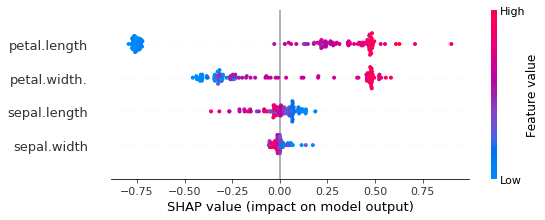

In [22]:
plt.clf()
shap.summary_plot(shap_values_gmm_train,X_train,features0,show=True)
plt.savefig('foo2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')



Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_


1.0583333333333331
[0.02222222 0.00277778 0.44027778 0.47638889]
[-0.02013889  0.02847222  0.24652778 -0.31319444]
[ 0.03263889 -0.04236111 -0.79375    -0.25486111]
['s.l', 's.w', 'p.l', 'p.w']


['s.l', 's.w', 'p.l', 'p.w']


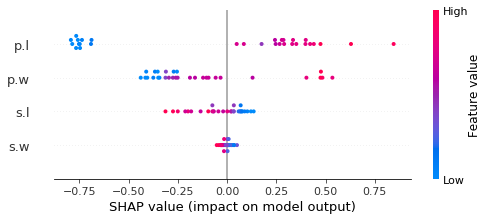

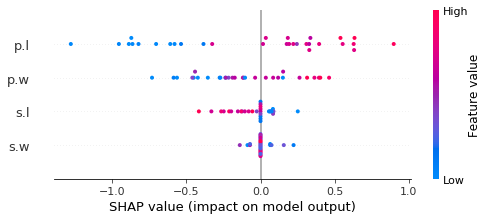

In [25]:
print(features)
shap.summary_plot(shap_values_gmm,X_test,features,show=True)
plt.savefig('foo2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')


explainer = shap.SamplingExplainer(gmm.predict, X_train, link="identity")
shap_values_sampling = explainer.shap_values(X_test, nsamples=100,rseed=0)

shap.summary_plot(shap_values_sampling,X_test,features,show=True)
plt.savefig('foo3.png',dpi=300,pad_inches=0.1,bbox_inches='tight')



In [17]:
print(np.array([X_test[0,:],X_test[1,:],X_test[2,:]]))

[[-0.05250608 -0.59237301  0.76275827  1.58046376]
 [ 0.18982966 -1.97355361  0.13754657 -0.26238682]
 [-0.41600969  2.63038172 -1.34022653 -1.3154443 ]]


In [222]:
#X_train, X_test, y_train, y_test = train_test_split(iris_X_scale, iris_y, test_size=0.2, random_state=0)
shap.initjs()
np.random.seed(0)



# use Kernel SHAP to explain test set predictions
explainer = shap.SamplingExplainer(gmm.predict, X_train, link="identity")
shap_values_SSVgmm = explainer.shap_values(np.array([X_test[0,:],X_test[1,:],X_test[2,:]]))
print(explainer.expected_value)
print(shap_values_SSVgmm[0])
print(shap_values_SSVgmm[1])
print(shap_values_SSVgmm[2])

shap.force_plot(explainer.expected_value, shap_values_SSVgmm[0], features0,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_SSVgmm.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values_SSVgmm[1], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_SSVgmm.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(explainer.expected_value, shap_values_SSVgmm[2], features0, matplotlib=True,link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_SSVgmm.png',dpi=300,pad_inches=0.1,bbox_inches='tight')




1.0583333333333331
[0.01230755 0.         0.45425012 0.475109  ]
[-0.0337744   0.02047111  0.24806003 -0.29309007]
[ 0.02823127 -0.04038519 -0.82738045 -0.21879897]


Intercept 1.2468678190076858
Prediction_local [2.37249816]
Right: 2
{0: 1.2468678190076858, 1: 1.2468678190076858}


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Intercept 1.6473211689704421
Prediction_local [1.1001139]
Right: 1


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Intercept 1.9229334589034948
Prediction_local [0.55625823]
Right: 0


[0.59216031 0.43380408 0.05908025 0.04058569]
[-0.46117808 -0.0757403  -0.07029234  0.06000346]
[-0.94130157 -0.39092258 -0.09228744  0.05783637]


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


In [224]:
#

explainer2 = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features, class_names=datasets.load_iris().target_names, random_state=0,verbose=True, mode='regression')

exp02 = explainer2.explain_instance(X_test[0], gmm.predict, num_features=4)
print(exp02.intercept)
exp02.show_in_notebook(show_table=True)
a=exp02.as_pyplot_figure();
plt.xlabel('Effect')
#a.savefig('iris_gmm_lime0.png',dpi=300, bbox_inches='tight')




exp12 = explainer2.explain_instance(X_test[1], gmm.predict, num_features=4)
exp12.show_in_notebook(show_table=True)
a=exp12.as_pyplot_figure();
plt.xlabel('Effect')
#a.savefig('iris_gmm_lime1.png',dpi=300, bbox_inches='tight')

exp22 = explainer2.explain_instance(X_test[2], gmm.predict, num_features=4)
exp22.show_in_notebook(show_table=True)
a=exp22.as_pyplot_figure();
plt.xlabel('Effect')
#a.savefig('iris_gmm_lime2.png',dpi=300, bbox_inches='tight')


lime0=np.array([exp02.as_list()[i][1] for i in range(len(exp02.as_list())) ])
lime1= np.array([exp12.as_list()[i][1] for i in range(len(exp12.as_list())) ])
lime2=np.array([exp22.as_list()[i][1] for i in range(len(exp22.as_list())) ])

lime0_feature=np.array([exp0.as_list()[i][0] for i in range(len(exp02.as_list())) ])
lime1_feature=np.array([exp1.as_list()[i][0] for i in range(len(exp12.as_list())) ])
lime2_feature=np.array([exp2.as_list()[i][0] for i in range(len(exp22.as_list())) ])

lime0_feature[2]=lime0_feature[2][0:10]+"\n"+lime0_feature[2][10:]

print(lime0)
print(lime1)
print(lime2)

print('LIME intercept sample 0')
print(exp2.intercept[2])
print('LIME coefficients sample 0')
print(lime2)
print('LIME intercept sample 1')
print(exp2.intercept[1])
print('LIME coefficients sample 1')
print(lime1)
print('LIME intercept sample 2')
print(exp2.intercept[0])
print('LIME coefficients sample 2')
print(lime0)




shap.force_plot(exp02.intercept[0], lime0, lime0_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_gmm_lime0.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(exp12.intercept[0], lime1, lime1_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.15, 2.2)
plt.savefig('iris_gmm_lime1.png',dpi=300,pad_inches=0.1,bbox_inches='tight')
shap.force_plot(exp22.intercept[0], lime2, lime2_feature,matplotlib=True, link="identity",show=False)
#plt.xlim(-0.1, 2.2)
plt.savefig('iris_gmm_lime2.png',dpi=300,pad_inches=0.1,bbox_inches='tight')




Intercept 1.2468678190076858
Prediction_local [2.37249816]
Right: 2
{0: 1.2468678190076858, 1: 1.2468678190076858}


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Intercept 1.6473211689704421
Prediction_local [1.1001139]
Right: 1


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Intercept 1.9229334589034948
Prediction_local [0.55625823]
Right: 0


[0.59216031 0.43380408 0.05908025 0.04058569]
[-0.46117808 -0.0757403  -0.07029234  0.06000346]
[-0.94130157 -0.39092258 -0.09228744  0.05783637]


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


[[-0.99699409  0.79471007 -1.30524965 -1.26144135]
 [ 0.04689704 -0.69870194  0.23573366  0.13402822]
 [ 0.9192279  -0.17155425  1.00516154  1.06899372]]


[[[0.18986827 0.28235377 0.01237463 0.01624321]
  [0.28235377 0.751345   0.01992246 0.02998255]
  [0.01237463 0.01992246 0.00656393 0.00444176]
  [0.01624321 0.02998255 0.00444176 0.01929883]]

 [[0.40643039 0.26319208 0.1349717  0.09302225]
  [0.26319208 0.54918361 0.10952702 0.11216985]
  [0.1349717  0.10952702 0.06962138 0.05141987]
  [0.09302225 0.11216985 0.05141987 0.05987592]]

 [[0.58232305 0.25448683 0.21334254 0.10981388]
  [0.25448683 0.57070264 0.09115241 0.13823289]
  [0.21334254 0.09115241 0.09966914 0.0490094 ]
  [0.10981388 0.13823289 0.0490094  0.11993079]]]
[[ 0.9969941   0.7947101  -1.3052496  -1.2614413 ]
 [ 0.05228776 -0.67947449  0.26043831  0.16452837]
 [ 0.9636517  -0.1581382   1.027569    1.095818  ]]
[[[0.16590817 0.15192651 0.01039647 0.01242623]
  [0.15192651 0.46864237 0.01080347 0.016688  ]
  [0.0103964

AttributeError: 'list' object has no attribute 'shape'

In [621]:
#np.random.seed(0)


gmm123 = mixture.GaussianMixture(3).fit(list(zip(X_train[:,0],X_train[:,1],X_train[:,2])),y_train)
gmm123_train=accuracy_score(y_train,gmm123.predict(list(zip(X_train[:,0],X_train[:,1],X_train[:,2]))))
gmm123_test=accuracy_score(y_test,gmm123.predict(list(zip(X_test[:,0],X_test[:,1],X_test[:,2]))))

print(gmm123_train)
print(gmm123.means_)

0.85
[[-0.99698922  0.79472966 -1.30524894]
 [-0.10747185 -0.96817509  0.3258646 ]
 [ 0.97094361 -0.02632557  0.90438762]]


In [622]:
#initializing means for all gmm's in the next section
means1=np.array([[ 0.18224795],
 [ 1.34087834],
 [-1.02309106]])
means2=np.array([[ 1.13290059],
 [-1.18422366],
 [-0.00603486]])
means3=np.array([[-1.30524979],
 [ 0.26255448],
 [ 0.96177846]])
means4=np.array([[-1.27451371],
 [ 0.16968111],
 [ 1.11581367]])
means12=np.array([[-0.98185422 , 0.86490112],
 [-0.04902285,-0.88020853],
 [ 1.01207876 , 0.01191774]])
means13=np.array([[-0.99699397 ,-1.30524965],
 [ 0.25830397 , 0.40239599],
 [ 0.97460229 , 1.08328053]])
means14=np.array([[-0.99868319 ,-1.28109218],
 [ 0.03078506 , 0.24851034],
 [ 1.11089449, 1.11630267]])
means23=np.array([[ 0.79547008, -1.30522216],
 [-0.09131629 , 0.67715011],
 [-1.01691154 , 0.67624678]])
means24=np.array([[ 0.84751516, -1.2631298 ],
 [-0.94547625 , 0.30723184],
 [-0.01523084 , 0.90581384]])
means34=np.array([[-1.30524987, -1.26144234],
 [ 0.2737836  , 0.164822  ],
 [ 1.02307817 , 1.10401013]])

means123=np.array([[-0.99698922 , 0.79472966 ,-1.30524894],
 [-0.10747185 ,-0.96817509 , 0.3258646 ],
 [ 0.97094361 ,-0.02632557 , 0.90438762]])
means124=np.array([[-0.99491595 , 0.8030732  ,-1.26170537],
 [-0.01899373, -0.80919881  ,0.30862626],
 [ 1.10358684 , 0.01006882 , 1.02427171]])
means134=np.array([[-0.99699403 ,-1.30524966 ,-1.26144135],
 [ 0.08356611 , 0.35693531 , 0.28592709],
 [ 1.16629917 , 1.10450023 , 1.183537  ]])
means234=np.array([[ 0.79471007, -1.30524965 ,-1.26144135],
 [-0.62998056 , 0.19922908 , 0.10249206],
 [-0.25387512 , 0.96837028 , 1.01647394]])
means1234=np.array([[-0.99699409  ,0.79471007, -1.30524965 ,-1.26144135],
 [ 0.04627877 ,-0.69878579 , 0.23490093 , 0.13326567],
 [ 0.91830207, -0.17232824 , 1.00455769 , 1.06807536]])

In [623]:
#Shapley regression values for the GMM model.
#initializing means for all gmm's in this section



#Training gmm model on all possible subsets:

np.random.seed(4)

gmm1 = mixture.GaussianMixture(3,means_init=means1).fit(X_train[:,0:1],y_train)
gmm1_train=accuracy_score(y_train,gmm1.predict(X_train[:,0:1]))
gmm1_test=accuracy_score(y_test,gmm1.predict(X_test[:,0:1]))

gmm2 = mixture.GaussianMixture(3,means_init=means2).fit(X_train[:,1:2],y_train)
gmm2_train=accuracy_score(y_train,gmm2.predict(X_train[:,1:2]))
gmm2_test=accuracy_score(y_test,gmm2.predict(X_test[:,1:2]))

gmm3 = mixture.GaussianMixture(3,means_init=means3).fit(X_train[:,2:3],y_train)
gmm3_train=accuracy_score(y_train,gmm3.predict(X_train[:,2:3]))
gmm3_test=accuracy_score(y_test,gmm3.predict(X_test[:,2:3]))

gmm4 = mixture.GaussianMixture(3,means_init=means4).fit(X_train[:,3:4],y_train)
gmm4_train=accuracy_score(y_train,gmm4.predict(X_train[:,3:4]))
gmm4_test=accuracy_score(y_test,gmm4.predict(X_test[:,3:4]))

gmm12 = mixture.GaussianMixture(3,means_init=means12).fit(list(zip(X_train[:,0],X_train[:,1])),y_train)
gmm12_train=accuracy_score(y_train,gmm12.predict(list(zip(X_train[:,0],X_train[:,1]))))
gmm12_test=accuracy_score(y_test,gmm12.predict(list(zip(X_test[:,0],X_test[:,1]))))

gmm13 = mixture.GaussianMixture(3,means_init=means13).fit(list(zip(X_train[:,0],X_train[:,2])),y_train)
gmm13_train=accuracy_score(y_train,gmm13.predict(list(zip(X_train[:,0],X_train[:,2]))))
gmm13_test=accuracy_score(y_test,gmm13.predict(list(zip(X_test[:,0],X_test[:,2]))))

gmm14 = mixture.GaussianMixture(3,means_init=means14).fit(list(zip(X_train[:,0],X_train[:,3])),y_train)
gmm14_train=accuracy_score(y_train,gmm14.predict(list(zip(X_train[:,0],X_train[:,3]))))
gmm14_test=accuracy_score(y_test,gmm14.predict(list(zip(X_test[:,0],X_test[:,3]))))

gmm23 = mixture.GaussianMixture(3,means_init=means23).fit(list(zip(X_train[:,1],X_train[:,2])),y_train)
gmm23_train=accuracy_score(y_train,gmm23.predict(list(zip(X_train[:,1],X_train[:,2]))))
gmm23_test=accuracy_score(y_test,gmm23.predict(list(zip(X_test[:,1],X_test[:,2]))))

gmm24 = mixture.GaussianMixture(3,means_init=means24).fit(list(zip(X_train[:,1],X_train[:,3])),y_train)
gmm24_train=accuracy_score(y_train,gmm24.predict(list(zip(X_train[:,1],X_train[:,3]))))
gmm24_test=accuracy_score(y_test,gmm24.predict(list(zip(X_test[:,1],X_test[:,3]))))

gmm34 = mixture.GaussianMixture(3,means_init=means34).fit(list(zip(X_train[:,2],X_train[:,3])),y_train)
gmm34_train=accuracy_score(y_train,gmm34.predict(list(zip(X_train[:,2],X_train[:,3]))))
gmm34_test=accuracy_score(y_test,gmm34.predict(list(zip(X_test[:,2],X_test[:,3]))))

gmm123 = mixture.GaussianMixture(3,means_init=means123).fit(list(zip(X_train[:,0],X_train[:,1],X_train[:,2])),y_train)
gmm123_train=accuracy_score(y_train,gmm123.predict(list(zip(X_train[:,0],X_train[:,1],X_train[:,2]))))
gmm123_test=accuracy_score(y_test,gmm123.predict(list(zip(X_test[:,0],X_test[:,1],X_test[:,2]))))

gmm124 = mixture.GaussianMixture(3,means_init=means124).fit(list(zip(X_train[:,0],X_train[:,1],X_train[:,3])),y_train)
gmm124_train=accuracy_score(y_train,gmm124.predict(list(zip(X_train[:,0],X_train[:,1],X_train[:,3]))))
gmm124_test=accuracy_score(y_test,gmm124.predict(list(zip(X_test[:,0],X_test[:,1],X_test[:,3]))))

gmm134 = mixture.GaussianMixture(3,means_init=means134).fit(list(zip(X_train[:,0],X_train[:,2],X_train[:,3])),y_train)
gmm134_train=accuracy_score(y_train,gmm134.predict(list(zip(X_train[:,0],X_train[:,2],X_train[:,3]))))
gmm134_test=accuracy_score(y_test,gmm134.predict(list(zip(X_test[:,0],X_test[:,2],X_test[:,3]))))

gmm234 = mixture.GaussianMixture(3,means_init=means234).fit(list(zip(X_train[:,1],X_train[:,2],X_train[:,3])),y_train)
gmm234_train=accuracy_score(y_train,gmm234.predict(list(zip(X_train[:,1],X_train[:,2],X_train[:,3]))))
gmm234_test=accuracy_score(y_test,gmm234.predict(list(zip(X_test[:,1],X_test[:,2],X_test[:,3]))))

gmm1234 = mixture.GaussianMixture(3,means_init=means1234).fit(X_train,y_train)
gmm1234_train=accuracy_score(y_train,gmm1234.predict(X_train))
gmm1234_test=accuracy_score(y_test,gmm1234.predict(X_test))

#computing weights for a subsets
weight1=math.factorial(0)*math.factorial(4-1)/math.factorial(4)
weight2=math.factorial(1)*math.factorial(4-1-1)/math.factorial(4)
weight3=math.factorial(2)*math.factorial(4-2-1)/math.factorial(4)
weight4=math.factorial(3)*math.factorial(4-3-1)/math.factorial(4)


#Values for the prediction on the Test set:
phi1_test=weight1*gmm1_test+weight2*(gmm12_test-gmm2_test+gmm13_test-gmm3_test+gmm14_test-gmm4_test)+weight3*(gmm123_test-gmm23_test+gmm124_test-gmm24_test+gmm134_test-gmm34_test)+weight4*(gmm1234_test-gmm234_test)
phi2_test=weight1*gmm2_test+weight2*(gmm12_test-gmm1_test+gmm23_test-gmm3_test+gmm24_test-gmm4_test)+weight3*(gmm123_test-gmm13_test+gmm124_test-gmm14_test+gmm234_test-gmm34_test)+weight4*(gmm1234_test-gmm134_test)
phi3_test=weight1*gmm3_test+weight2*(gmm13_test-gmm1_test+gmm23_test-gmm2_test+gmm34_test-gmm4_test)+weight3*(gmm123_test-gmm12_test+gmm234_test-gmm24_test+gmm134_test-gmm14_test)+weight4*(gmm1234_test-gmm124_test)
phi4_test=weight1*gmm4_test+weight2*(gmm14_test-gmm1_test+gmm24_test-gmm2_test+gmm34_test-gmm3_test)+weight3*(gmm124_test-gmm12_test+gmm234_test-gmm23_test+gmm134_test-gmm13_test)+weight4*(gmm1234_test-gmm123_test)
print('Values for the prediction on the Test set:')
print('phi_1:')
print(phi1_test)
print('phi_2:')
print(phi2_test)
print('phi_3:')
print(phi3_test)
print('phi_4:')
print(phi4_test)
print('sum phi:')
print(phi1_test+phi2_test+phi3_test+phi4_test)

#Values for the prediction on the training set:
phi1=weight1*gmm1_train+weight2*(gmm12_train-gmm2_train+gmm13_train-gmm3_train+gmm14_train-gmm4_train)+weight3*(gmm123_train-gmm23_train+gmm124_train-gmm24_train+gmm134_train-gmm34_train)+weight4*(gmm1234_train-gmm234_train)
phi2=weight1*gmm2_train+weight2*(gmm12_train-gmm1_train+gmm23_train-gmm3_train+gmm24_train-gmm4_train)+weight3*(gmm123_train-gmm13_train+gmm124_train-gmm14_train+gmm234_train-gmm34_train)+weight4*(gmm1234_train-gmm134_train)
phi3=weight1*gmm3_train+weight2*(gmm13_train-gmm1_train+gmm23_train-gmm2_train+gmm34_train-gmm4_train)+weight3*(gmm123_train-gmm12_train+gmm234_train-gmm24_train+gmm134_train-gmm14_train)+weight4*(gmm1234_train-gmm124_train)
phi4=weight1*gmm4_train+weight2*(gmm14_train-gmm1_train+gmm24_train-gmm2_train+gmm34_train-gmm3_train)+weight3*(gmm124_train-gmm12_train+gmm234_train-gmm23_train+gmm134_train-gmm13_train)+weight4*(gmm1234_train-gmm123_train)
print('Values for the prediction on the Training set:')
print('phi_1:')
print(phi1)
print('phi_2:')
print(phi2)
print('phi_3:')
print(phi3)
print('phi_4:')
print(phi4)
print('sum phi:')
print(phi1+phi2+phi3+phi4)






Values for the prediction on the Test set:
phi_1:
0.08333333333333334
phi_2:
0.17222222222222225
phi_3:
0.25555555555555554
phi_4:
0.48888888888888893
sum phi:
1.0
Values for the prediction on the Training set:
phi_1:
0.08124999999999999
phi_2:
0.18125000000000002
phi_3:
0.2909722222222222
phi_4:
0.429861111111111
sum phi:
0.9833333333333332
0.2
0.5666666666666667
0.6666666666666666
0.9666666666666667
0.7666666666666667
0.9666666666666667
0.9666666666666667
0.7666666666666667
0.9666666666666667
1.0
0.6333333333333333
0.9333333333333333
0.9666666666666667
0.9666666666666667
1.0
0.13333333333333333
0.55
0.8166666666666667
0.9583333333333334
0.8
0.9083333333333333
0.95
0.6666666666666666
0.925
0.975
0.8166666666666667
0.9416666666666667
0.925
0.9416666666666667
0.9833333333333333


In [238]:
#Shapley regression values for the Linear regression model.

#training on every possible subset.
lm1 = linear_model.LinearRegression().fit(X_train[:,0:1],y_train)
lm1_train=accuracy_score(y_train, np.round(lm1.predict(X_train[:,0:1])))
lm1_test=accuracy_score(y_test, np.round(lm1.predict(X_test[:,0:1])))

lm2 = linear_model.LinearRegression().fit(X_train[:,1:2],y_train)
lm2_train=accuracy_score(y_train, np.round(lm2.predict(X_train[:,0:1])))
lm2_test=accuracy_score(y_test, np.round(lm2.predict(X_test[:,0:1])))

lm3 = linear_model.LinearRegression().fit(X_train[:,2:3],y_train)
lm3_train=accuracy_score(y_train, np.round(lm3.predict(X_train[:,0:1])))
lm3_test=accuracy_score(y_test, np.round(lm3.predict(X_test[:,0:1])))

lm4 = linear_model.LinearRegression().fit(X_train[:,3:4],y_train)
lm4_train=accuracy_score(y_train, np.round(lm4.predict(X_train[:,0:1])))
lm4_test=accuracy_score(y_test, np.round(lm4.predict(X_test[:,0:1])))

lm12 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,1])),y_train)
lm12_train=accuracy_score(y_train,np.round(lm12.predict(list(zip(X_train[:,0],X_train[:,1])))))
lm12_test=accuracy_score(y_test,np.round(lm12.predict(list(zip(X_test[:,0],X_test[:,1])))))

lm13 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,2])),y_train)
lm13_train=accuracy_score(y_train,np.round(lm13.predict(list(zip(X_train[:,0],X_train[:,2])))))
lm13_test=accuracy_score(y_test,np.round(lm13.predict(list(zip(X_test[:,0],X_test[:,2])))))

lm14 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,3])),y_train)
lm14_train=accuracy_score(y_train,np.round(lm14.predict(list(zip(X_train[:,0],X_train[:,3])))))
lm14_test=accuracy_score(y_test,np.round(lm14.predict(list(zip(X_test[:,0],X_test[:,3])))))

lm23 = linear_model.LinearRegression().fit(list(zip(X_train[:,1],X_train[:,2])),y_train)
lm23_train=accuracy_score(y_train,np.round(lm23.predict(list(zip(X_train[:,1],X_train[:,2])))))
lm23_test=accuracy_score(y_test,np.round(lm23.predict(list(zip(X_test[:,1],X_test[:,2])))))

lm24 = linear_model.LinearRegression().fit(list(zip(X_train[:,1],X_train[:,3])),y_train)
lm24_train=accuracy_score(y_train,np.round(lm24.predict(list(zip(X_train[:,1],X_train[:,3])))))
lm24_test=accuracy_score(y_test,np.round(lm24.predict(list(zip(X_test[:,1],X_test[:,3])))))

lm34 = linear_model.LinearRegression().fit(list(zip(X_train[:,2],X_train[:,3])),y_train)
lm34_train=accuracy_score(y_train,np.round(lm34.predict(list(zip(X_train[:,2],X_train[:,3])))))
lm34_test=accuracy_score(y_test,np.round(lm34.predict(list(zip(X_test[:,2],X_test[:,3])))))

lm123 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,1],X_train[:,2])),y_train)
lm123_train=accuracy_score(y_train,np.round(lm123.predict(list(zip(X_train[:,0],X_train[:,1],X_train[:,2])))))
lm123_test=accuracy_score(y_test,np.round(lm123.predict(list(zip(X_test[:,0],X_test[:,1],X_test[:,2])))))

lm124 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,1],X_train[:,3])),y_train)
lm124_train=accuracy_score(y_train,np.round(lm124.predict(list(zip(X_train[:,0],X_train[:,1],X_train[:,3])))))
lm124_test=accuracy_score(y_test,np.round(lm124.predict(list(zip(X_test[:,0],X_test[:,1],X_test[:,3])))))

lm134 = linear_model.LinearRegression().fit(list(zip(X_train[:,0],X_train[:,2],X_train[:,3])),y_train)
lm134_train=accuracy_score(y_train,np.round(lm134.predict(list(zip(X_train[:,0],X_train[:,2],X_train[:,3])))))
lm134_test=accuracy_score(y_test,np.round(lm134.predict(list(zip(X_test[:,0],X_test[:,2],X_test[:,3])))))

lm234 = linear_model.LinearRegression().fit(list(zip(X_train[:,1],X_train[:,2],X_train[:,3])),y_train)
lm234_train=accuracy_score(y_train,np.round(lm234.predict(list(zip(X_train[:,1],X_train[:,2],X_train[:,3])))))
lm234_test=accuracy_score(y_test,np.round(lm234.predict(list(zip(X_test[:,1],X_test[:,2],X_test[:,3])))))

lm1234 = linear_model.LinearRegression().fit(X_train,y_train)
lm1234_train=accuracy_score(y_train,np.round(lm1234.predict(X_train)))
lm1234_test=accuracy_score(y_test,np.round(lm1234.predict(X_test)))



weight1=math.factorial(0)*math.factorial(4-1)/math.factorial(4)
weight2=math.factorial(1)*math.factorial(4-1-1)/math.factorial(4)
weight3=math.factorial(2)*math.factorial(4-2-1)/math.factorial(4)
weight4=math.factorial(3)*math.factorial(4-3-1)/math.factorial(4)

#shapley for Test set
phi1=weight1*lm1_test+weight2*(lm12_test-lm2_test+lm13_test-lm3_test+lm14_test-lm4_test)+weight3*(lm123_test-lm23_test+lm124_test-lm24_test+lm134_test-lm34_test)+weight4*(lm1234_test-lm234_test)
phi2=weight1*lm2_test+weight2*(lm12_test-lm1_test+lm23_test-lm3_test+lm24_test-lm4_test)+weight3*(lm123_test-lm13_test+lm124_test-lm14_test+lm234_test-lm34_test)+weight4*(lm1234_test-lm134_test)
phi3=weight1*lm3_test+weight2*(lm13_test-lm1_test+lm23_test-lm2_test+lm34_test-lm4_test)+weight3*(lm123_test-lm12_test+lm234_test-lm24_test+lm134_test-lm14_test)+weight4*(lm1234_test-lm124_test)
phi4=weight1*lm4_test+weight2*(lm14_test-lm1_test+lm24_test-lm2_test+lm34_test-lm3_test)+weight3*(lm124_test-lm12_test+lm234_test-lm23_test+lm134_test-lm13_test)+weight4*(lm1234_test-lm123_test)

print('Values for the GMM on the Test set:')
print('phi_1:')
print(phi1)
print('phi_2:')
print(phi2)
print('phi_3:')
print(phi3)
print('phi_4:')
print(phi4)
print('sum phi:')
print(phi1+phi2+phi3+phi4)

#shapley for Training set
phi1=weight1*lm1_train+weight2*(lm12_train-lm2_train+lm13_train-lm3_train+lm14_train-lm4_train)+weight3*(lm123_train-lm23_train+lm124_train-lm24_train+lm134_train-lm34_train)+weight4*(lm1234_train-lm234_train)
phi2=weight1*lm2_train+weight2*(lm12_train-lm1_train+lm23_train-lm3_train+lm24_train-lm4_train)+weight3*(lm123_train-lm13_train+lm124_train-lm14_train+lm234_train-lm34_train)+weight4*(lm1234_train-lm134_train)
phi3=weight1*lm3_train+weight2*(lm13_train-lm1_train+lm23_train-lm2_train+lm34_train-lm4_train)+weight3*(lm123_train-lm12_train+lm234_train-lm24_train+lm134_train-lm14_train)+weight4*(lm1234_train-lm124_train)
phi4=weight1*lm4_train+weight2*(lm14_train-lm1_train+lm24_train-lm2_train+lm34_train-lm3_train)+weight3*(lm124_train-lm12_train+lm234_train-lm23_train+lm134_train-lm13_train)+weight4*(lm1234_train-lm123_train)


print('Values for the GMM on the Training set:')
print('phi_1:')
print(phi1)
print('phi_2:')
print(phi2)
print('phi_3:')
print(phi3)
print('phi_4:')
print(phi4)
print('sum phi:')
print(phi1+phi2+phi3+phi4)



0.975
0.9666666666666667
0.7916666666666666
0.7333333333333333
0.975
0.9666666666666667
0.9583333333333334
1.0
Values for the GMM on the Test set:
phi_1:
0.25555555555555554
phi_2:
0.17777777777777778
phi_3:
0.2833333333333333
phi_4:
0.2833333333333333
sum phi:
1.0
Values for the GMM on the Training set:
phi_1:
0.25625
phi_2:
0.13680555555555554
phi_3:
0.28402777777777777
phi_4:
0.28125000000000006
sum phi:
0.9583333333333333


0.9833333333333333
1.0
0.01992246021603962
[[0.18986827 0.28235377 0.01237463 0.01624321]
 [0.28235377 0.751345   0.01992246 0.02998255]
 [0.01237463 0.01992246 0.00656393 0.00444176]
 [0.01624321 0.02998255 0.00444176 0.01929883]]
[[0.18986827 0.28235377 0.01237463 0.01624321]
 [0.28235377 0.751345   0.01992246 0.02998255]
 [0.01237463 0.01992246 0.00656393 0.00444176]
 [0.01624321 0.02998255 0.00444176 0.01929883]]
[[0. 0.]
 [0. 0.]]
row
rowcol
0
0
0.2823537690191417
ij
0
1
r
rowcol
0
1
0.012374632253030893
ij
0
2
r
row
rowcol
1
0
0.7513450020187284
ij
1
1
r
rowcol
1
1
0.01992246021603962
ij
1
2
r
row
row
[[0.28235377 0.01237463]
 [0.751345   0.01992246]]
0
[[0.18986827 0.28235377 0.01237463 0.01624321]
 [0.28235377 0.751345   0.01992246 0.02998255]
 [0.01237463 0.01992246 0.00656393 0.00444176]
 [0.01624321 0.02998255 0.00444176 0.01929883]]
range(2, 4)
range(0, 4)
[[0.]]


[[ 0.3 -0.1]
 [ 0.1 -0.2]]
[[1.  0.5]
 [0.5 1. ]]


3.0


ModuleNotFoundError: No module named 'pypr'

[[ 0.79699773 -1.3051675  -1.26151344]
 [-0.12955112  0.93918818  1.24035808]
 [-0.52512786  0.55007549  0.39573194]]
[ 1.64888647  5.05442859 -0.31172707]
[[[0.74621575 0.01973039 0.03018744]
  [0.01973039 0.00656221 0.00445198]
  [0.03018744 0.00445198 0.01931001]]

 [[0.44696506 0.08935765 0.15147628]
  [0.08935765 0.04629788 0.04552188]
  [0.15147628 0.04552188 0.08270398]]

 [[0.66709814 0.20214682 0.18691168]
  [0.20214682 0.27411733 0.20833164]
  [0.18691168 0.20833164 0.18698148]]]
[[-0.05250608 -0.59237301  0.76275827]
 [ 0.18982966 -1.97355361  0.13754657]
 [-0.41600969  2.63038172 -1.34022653]
 [ 1.76501198 -0.36217625  1.44480739]
 [-1.02184904  0.78880759 -1.2833891 ]
 [ 0.55333328  0.55861082  1.27429511]
 [-1.02184904  1.01900435 -1.39706395]
 [ 1.03800476  0.09821729  0.53540856]
 [ 1.15917263 -0.59237301  0.59224599]
 [ 0.31099753 -0.59237301  0.13754657]
 [ 0.31099753 -1.05276654  1.0469454 ]
 [ 0.67450115  0.32841405  0.42173371]
 [ 0.31099753 -0.59237301  0.53540856

array([2, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 2])

In [293]:
#condition on a second value
#X[0]andX[1]

#copy of earlier X0:
#cluster0 
g01cov0=deepcopy(g0cov0)
g01m0=deepcopy(g0m0)

cluster=0
komb=[1,2]
print(g01cov0)

a=g0cov0[komb,:]
a=a[:,komb]

print(a)
c=np.matrix(g01cov0[0,0])
c=np.linalg.inv(c)
b=np.matrix(g01cov0[0,:])
b=b[:,komb]
print(b)

g2cov0=a.T-b.T.dot(c).dot(b)
g01m0=g01m0[0,komb].T+b.T.dot(c)*(X_train[0,1]-g01m0[0,0])
g2m0=g2m0.T





[[0.33145571 0.0015201  0.00582722]
 [0.0015201  0.00575742 0.00338311]
 [0.00582722 0.00338311 0.01790922]]
[[0.00575742 0.00338311]
 [0.00338311 0.01790922]]
[[0.0015201  0.00582722]]


IndexError: index 1 is out of bounds for axis 1 with size 1

/Users/vegard/Bachelor
/usr/local/root/obj/lib
/Users/vegard/Bachelor
/Users/vegard/opt/anaconda3/lib/python37.zip
/Users/vegard/opt/anaconda3/lib/python3.7
/Users/vegard/opt/anaconda3/lib/python3.7/lib-dynload

/Users/vegard/.local/lib/python3.7/site-packages
/Users/vegard/opt/anaconda3/lib/python3.7/site-packages
/Users/vegard/opt/anaconda3/lib/python3.7/site-packages/aeosa
/Users/vegard/opt/anaconda3/lib/python3.7/site-packages/IPython/extensions
/Users/vegard/.ipython
